# COVID-19-EU - Last 60 Days Daily Evolution  

<div style="float:right; a.color: grey;">
    <a href="https://github.com/matosdotnet">
        <img src="https://avatars3.githubusercontent.com/u/64945038?s=60&v=4">
        matosdotnet
    </a>
</div>

<ul> 
        <li>New Cases</li>
        <li>New Deaths</li>
        <li>New Suspects</li>
        <li>New Recovered</li>
      </ul>
       Data Source: 
        <a href="https://opendata.ecdc.europa.eu/covid19/casedistribution/csv">https://opendata.ecdc.europa.eu/covid19/casedistribution/csv</a>


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
import datetime
%matplotlib inline

# Define the last number of days here
nr_last_days = 60
#List of Countries to visualize
l_countries = ['Portugal','Spain','Switzerland','Sweden','Italy','Greece','Slovenia','Bulgaria']

s_title = 'COVID-19 EU'
s_url = 'https://opendata.ecdc.europa.eu/covid19/casedistribution/csv'
s_url_confirmations = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
s_url_deaths = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
s_url_recoveries = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv'
s_local_snapshot_path = 'data/data-eu.csv'

In [2]:
#define dictionaries with metadata
d_confirmations = {'key' : 'cases', 'label' : 'Cases', 'color' : '#00D0FE'}
d_new_confirmations = {'key' : 'cases_new', 'label' : 'New Cases', 'color' : '#00D0FE'}

d_deaths = {'key' : 'deaths', 'label' : 'Deaths', 'color' : '#FE0004'}
d_new_deaths = {'key' : 'deaths_new', 'label' : 'New Deaths', 'color' : '#FE0004'}

#d_recoveries = {'key' : 'recoveries', 'label' : 'Recoveries', 'color' : '#7FFE00'}
#d_new_recoveries = {'key' : 'recoveries_new', 'label' : 'New Recoveries', 'color' : '#7FFE00'}

#d_active = {'key' : 'active', 'label' : 'Active', 'color' : '#FE0004'}
#d_new_active = {'key' : 'active_new', 'label' : 'New Active', 'color' : '#FE00F6'}

In [3]:
def read_data_remote():
    # Read Source Data
    df_full =  pd.read_csv(s_url)
    #transform 
    df_full['id'] = df_full[['countriesAndTerritories','geoId','countryterritoryCode','continentExp']].apply(lambda x : '{}_{}_{}_{}'.format(
                                                                                                x['countriesAndTerritories']
                                                                                               ,x['geoId']
                                                                                               ,x['countryterritoryCode']
                                                                                               ,x['continentExp']
                                                                                               ),axis=1) 
    # Manage Dates Formating - EU date is onde day advanced to the reported data therefore 1 days is deducted
    df_full['dateRep'] = df_full['dateRep'].apply(lambda x : pd.to_datetime(x,format='%d/%m/%Y')-datetime.timedelta(days=1)) 
    # New Confirmations, Deaths   
    df_full = df_full.sort_values(by=['id', 'dateRep'])
    #df_full[[d_new_confirmations['key'], d_new_deaths['key']]] = df_full.groupby(['id'])[[d_confirmations['key'], d_deaths['key']]].diff().fillna(0)
    df_full[[d_new_confirmations['key'], d_new_deaths['key']]] = df_full[[d_confirmations['key'], d_deaths['key']]]
    #Set Index
    df_full = df_full.set_index(['dateRep'])
    
    #Fill Null values
    df_full.fillna(value=0, inplace=True)
    #save locally
    df_full.to_csv(s_local_snapshot_path)
    return df_full

def read_data_local() :  
    df_full = pd.read_csv(s_local_snapshot_path)
    df_full['dateRep'] = df_full['dateRep'].apply(lambda x : pd.to_datetime(x))
    df_full = df_full.set_index(['dateRep'])
    return df_full 

def read_data() :
    df_full = pd.DataFrame()
    try:
        df_full = read_data_remote()
    except:
        df_full = read_data_local()
        print("An exception occurred reading data from \n{}Alternatively the latest Snapshot from {} was retrieved.".format(s_url,df_full.index.max()))
    else:
         print("Data collected sucessfully from: \n{}\nMax data set date: {}".format(s_url,df_full.index.max()))
    return df_full

def get_country_df(country_name,df = pd.DataFrame()):   
    df_country = df[df['countriesAndTerritories']==country_name].reset_index().groupby(['dateRep','countriesAndTerritories']).sum()
    df_country = df_country.reset_index()
    df_country = df_country.set_index('dateRep')
    return df_country

In [4]:
#Read Data
df_full  = read_data()
#df_full  = read_data_local()

Data collected sucessfully from: 
https://opendata.ecdc.europa.eu/covid19/casedistribution/csv
Max data set date: 2020-05-29 00:00:00


In [5]:
#Slice and Groupy
df_latest = df_full[df_full['countriesAndTerritories'].isin(l_countries)]
#Drop Columns not needed
df_latest.drop(['geoId','countryterritoryCode','continentExp'],axis=1, inplace=True)
#Create Tailored Data Frames
df_latest_collection = {} 
for c in df_latest['countriesAndTerritories'].unique() :
    df_latest_collection[c] = get_country_df(c,df_latest).tail(nr_last_days)
#Create Tailored Data Frames in one
df_latest = pd.concat(df for df in df_latest_collection.values()) 

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [6]:
#Latest Row per country
df_latest.groupby('countriesAndTerritories').tail(1)

,countriesAndTerritories,day,month,year,cases,deaths,popData2018,cases_new,deaths_new
dateRep,,,,,,,,,
2020-05-29,Bulgaria,30,5,2020,14,3,7024216.0,14,3
2020-05-29,Greece,30,5,2020,3,0,10727668.0,3,0
2020-05-29,Italy,30,5,2020,516,87,60431283.0,516,87
2020-05-29,Portugal,30,5,2020,350,14,10281762.0,350,14
2020-05-29,Slovenia,30,5,2020,0,0,2067372.0,0,0
2020-05-28,Spain,29,5,2020,658,2,46723749.0,658,2
2020-05-29,Sweden,30,5,2020,749,84,10183175.0,749,84
2020-05-29,Switzerland,30,5,2020,32,2,8516543.0,32,2


In [7]:
df_latest.groupby('countriesAndTerritories')[[d_new_confirmations['key'],d_new_deaths['key']]].describe().transpose()

countriesAndTerritories   Bulgaria      Greece        Italy     Portugal  \
cases_new  count         60.000000   60.000000    60.000000    60.000000   
           mean          35.666667   28.283333  2175.150000   425.633333   
           std           21.344365   33.438074  1419.729323   287.558865   
           min            0.000000    0.000000   300.000000  -161.000000   
           25%           24.000000    6.000000   810.250000   222.000000   
           50%           33.000000   15.500000  1932.500000   349.500000   
           75%           46.000000   34.750000  3400.250000   611.750000   
           max           91.000000  156.000000  4805.000000  1516.000000   
deaths_new count         60.000000   60.000000    60.000000    60.000000   
           mean           2.183333    2.200000   360.633333    20.716667   
           std            1.631176    2.105682   211.789628    10.704176   
           min            0.000000    0.000000    50.000000     0.000000   
           25%            1.000000    1.000000   170.250000    13.000000   
           50%            2.000000    2.000000   328.000000    18.500000   
           75%            3.000000    3.000000   535.500000    28.250000   
           max            6.000000    9.000000   839.000000    60.000000   

countriesAndTerritories   Slovenia        Spain      Sweden  Switzerland  
cases_new  count         60.000000    60.000000   60.000000    60.000000  
           mean          11.833333  2374.033333  540.800000   255.550000  
           std           14.552263  2222.304362  146.630031   302.098953  
           min            0.000000  -713.000000  234.000000     0.000000  
           25%            1.000000   649.750000  418.250000    38.250000  
           50%            5.000000  1456.000000  553.500000   115.500000  
           75%           19.250000  3818.500000  650.750000   338.500000  
           max           56.000000  8145.000000  812.000000  1124.000000  
deaths_new count         60.000000    60.000000   60.000000    60.000000  
           mean           1.616667   343.216667   70.066667    22.683333  
           std            1.647717   405.190104   45.248417    21.029029  
           min            0.000000 -1918.000000    2.000000     0.000000  
           25%            0.000000   141.750000   33.250000     6.000000  
           50%            1.000000   285.500000   67.000000    16.000000  
           75%            2.000000   617.500000   96.750000    41.250000  
           max            6.000000   950.000000  185.000000    78.000000

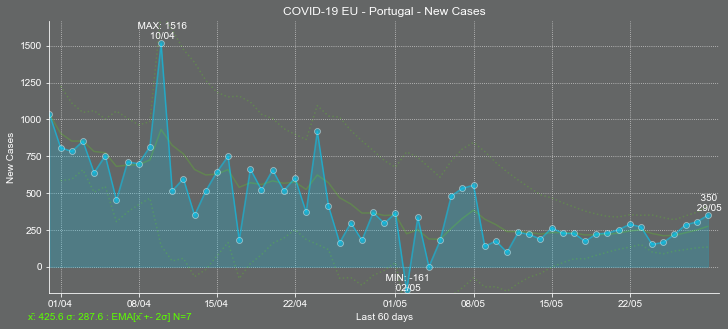

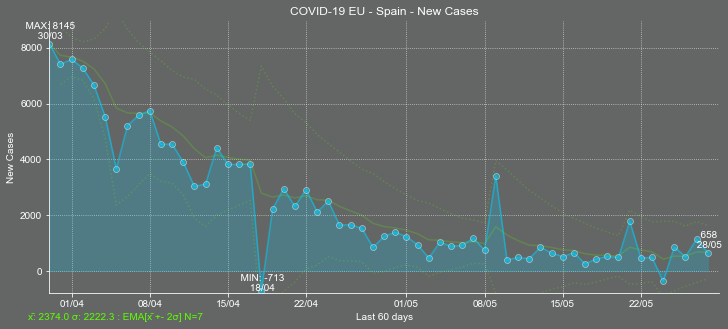

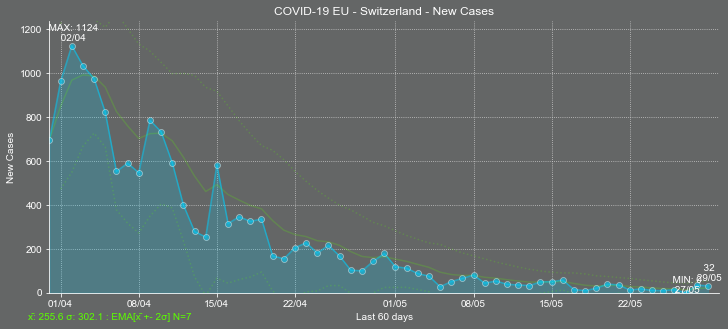

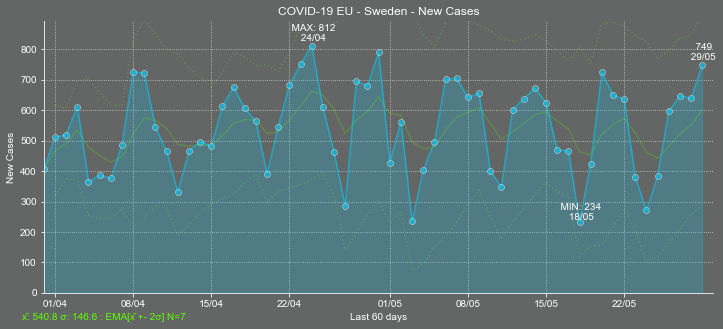

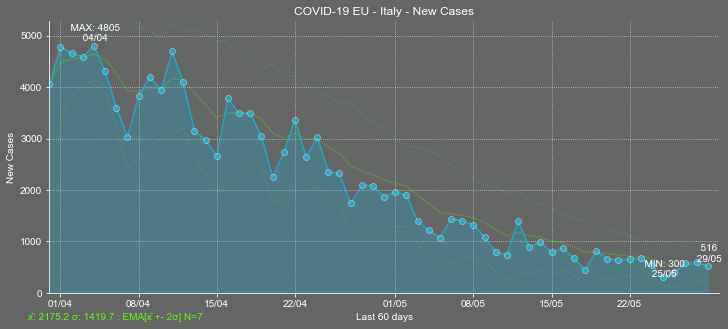

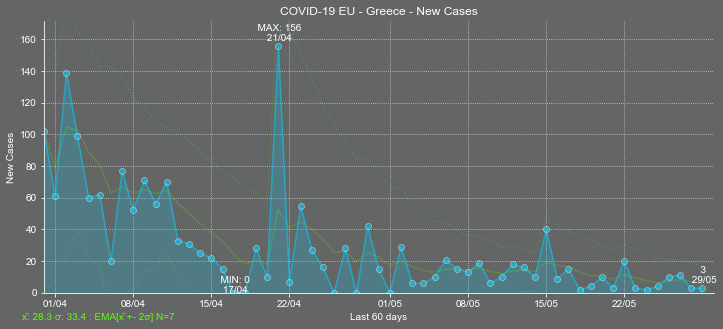

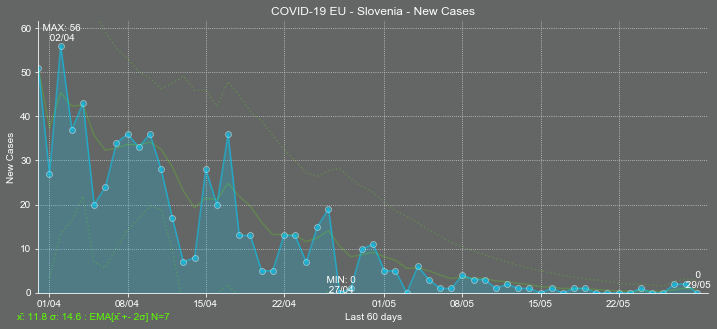

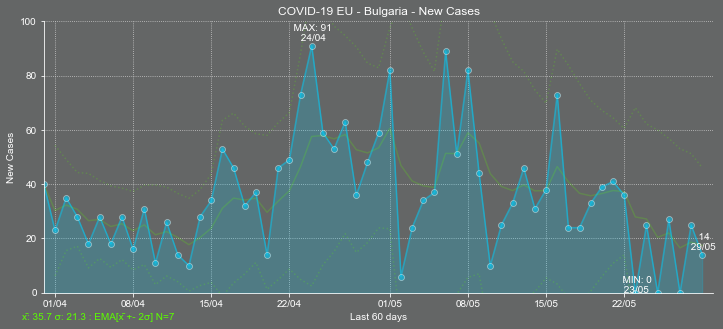

In [8]:
from MatosDotNetStandardCharts import line_plot_df_tindex 

for c  in l_countries :
    df = df_latest[df_latest['countriesAndTerritories']==c]
    line_plot_df_tindex(
                d_new_confirmations['key']
                ,data=df
                ,title='{} - {} - {}'.format(s_title,df['countriesAndTerritories'].unique()[0],d_new_confirmations['label'])
                ,ylabel=d_new_confirmations['label']
                ,ycolor=d_new_confirmations['color']
               )

In [9]:
df_latest[df_latest['countriesAndTerritories']=='Portugal'][[d_confirmations['key'],d_new_confirmations['key']]]['2020-05-01':'2020-05-02']

,cases,cases_new
dateRep,,
2020-05-01,364,364
2020-05-02,-161,-161


[Relatório de Situação nº 060 | 01/05/2020](https://covid19.min-saude.pt/wp-content/uploads/2020/05/60_DGS_boletim_20200501_NOVO_05_05.pdf)

In [10]:
# Trace outstanding vales
df_latest[df_latest['countriesAndTerritories']=='Portugal'][[d_confirmations['key'],d_new_confirmations['key']]]['2020-04-09':'2020-04-11']

,cases,cases_new
dateRep,,
2020-04-09,815,815
2020-04-10,1516,1516
2020-04-11,515,515


<a href="https://covid19.min-saude.pt/wp-content/uploads/2020/04/39_DGS_boletim_20200410.pdf">Relatório de Situação nº 039 | 10/04/2020</a>
<br/>
    <a href="https://www.publico.pt/2020/04/10/sociedade/noticia/covid19-ha-26-mortes-1516-infectados-portugal-1911826">Covid-19: há mais 26 mortes e mais 1516 infectados em Portugal<a/>
    <br/>
    <a href="https://www.jornaldenegocios.pt/economia/coronavirus/detalhe/morreram-mais-26-pessoas-em-portugal-com-covid-19-e-casos-confirmados-aumentam-mais-de-10">Morreram mais 26 pessoas em Portugal com covid-19 e casos confirmados aumentam mais de 10%</a>

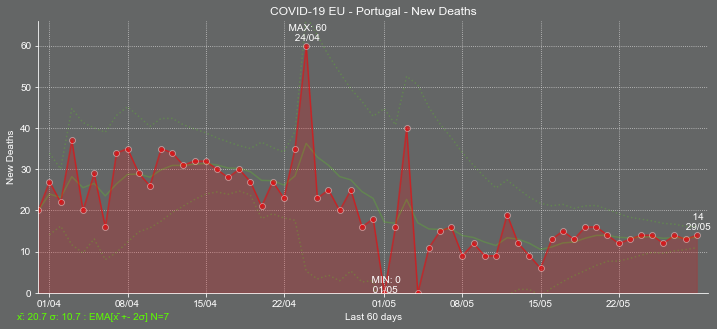

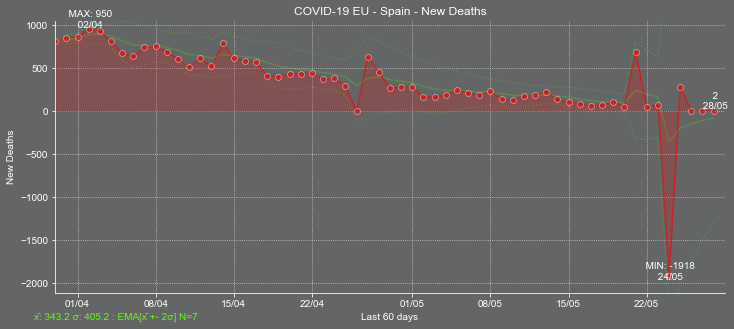

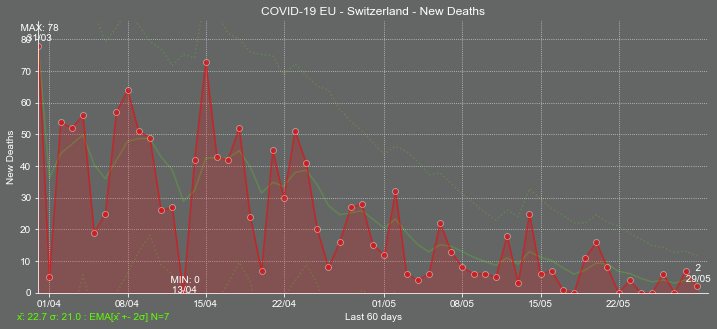

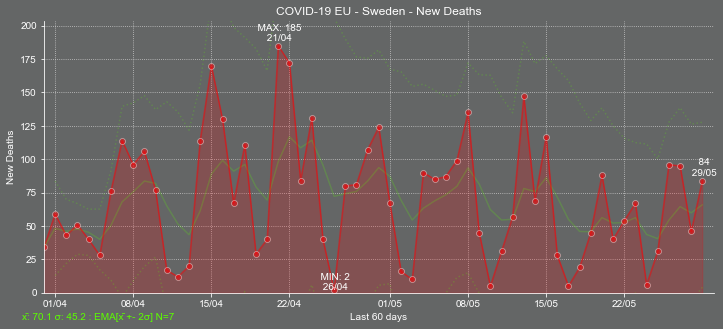

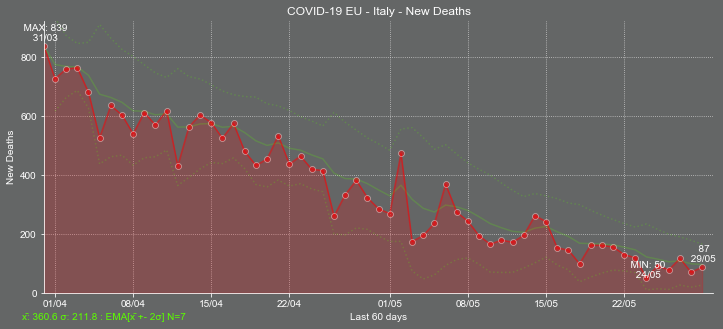

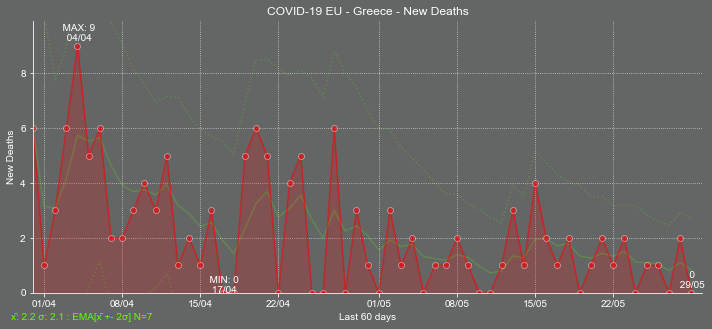

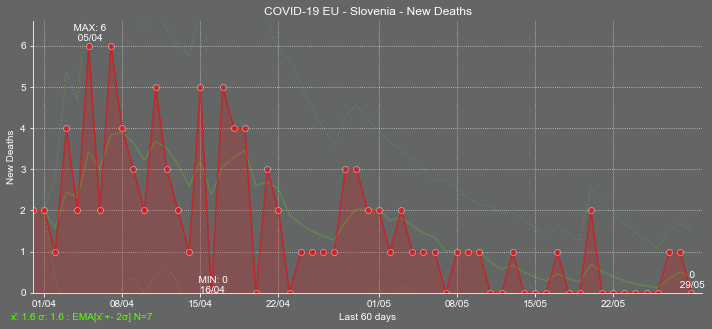

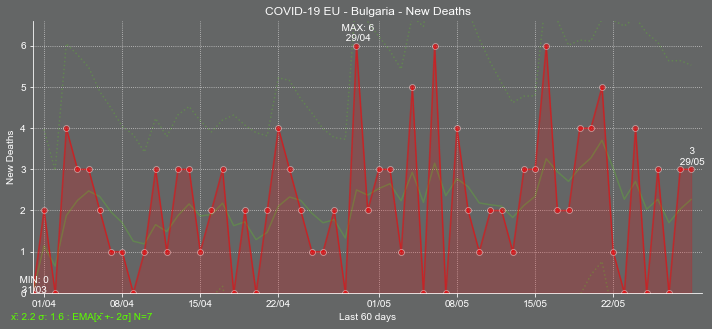

In [11]:
for c  in l_countries :
    df = df_latest[df_latest['countriesAndTerritories']==c]
    line_plot_df_tindex(
                d_new_deaths['key']
                ,data=df
                ,title='{} - {} - {}'.format(s_title,df['countriesAndTerritories'].unique()[0],d_new_deaths['label'])
                ,ylabel=d_new_deaths['label']
                ,ycolor=d_new_deaths['color']
               )

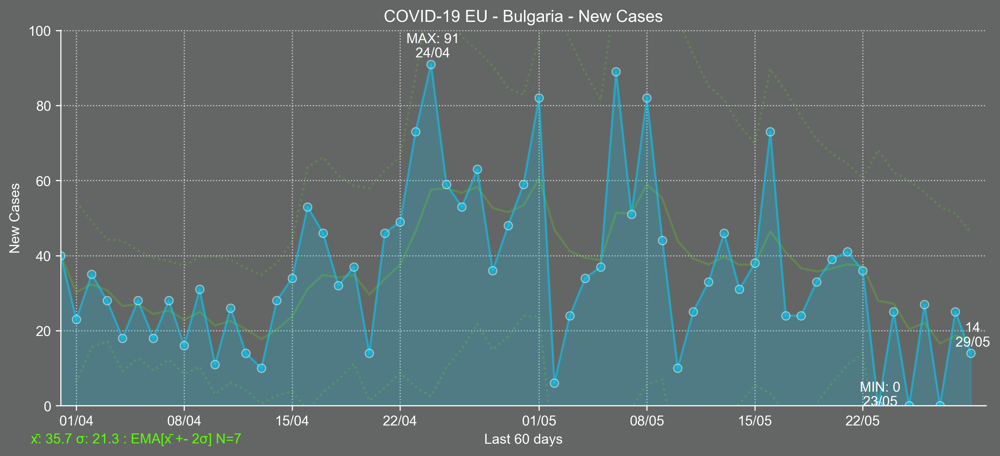

img\COVID-19 EU - Bulgaria - New Cases.png


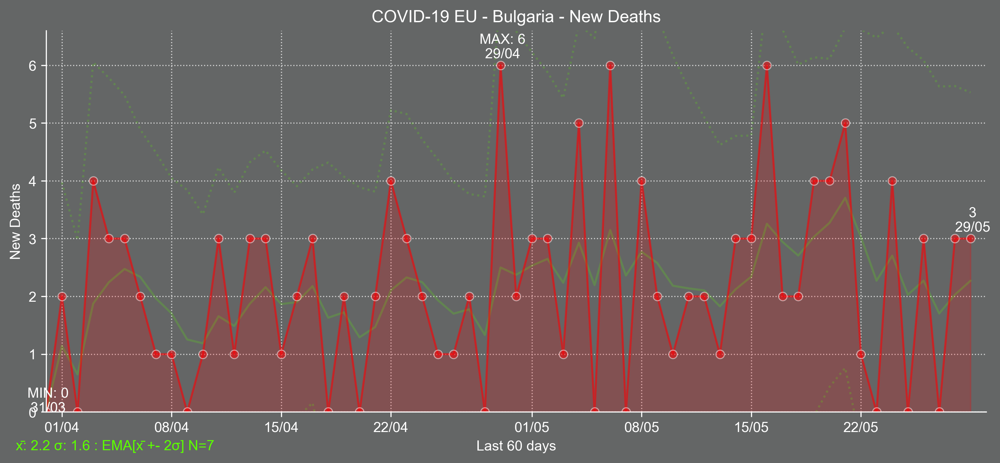

img\COVID-19 EU - Bulgaria - New Deaths.png


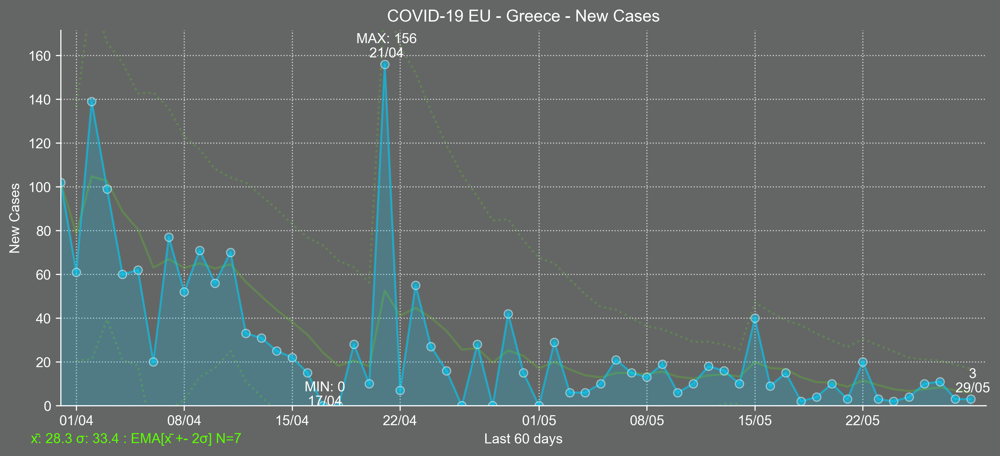

img\COVID-19 EU - Greece - New Cases.png


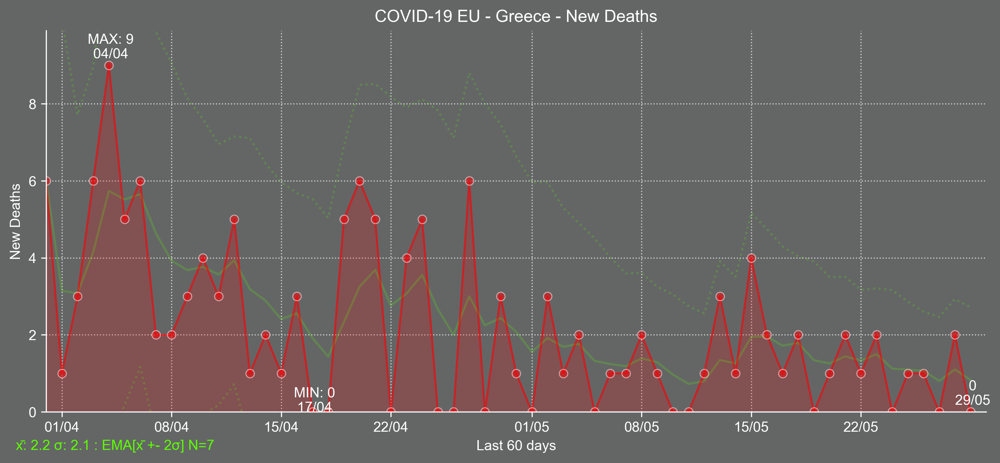

img\COVID-19 EU - Greece - New Deaths.png


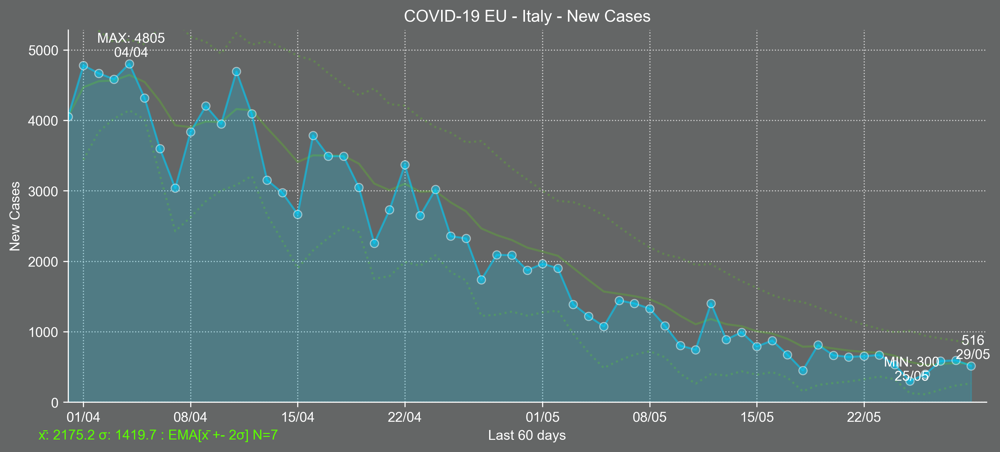

img\COVID-19 EU - Italy - New Cases.png


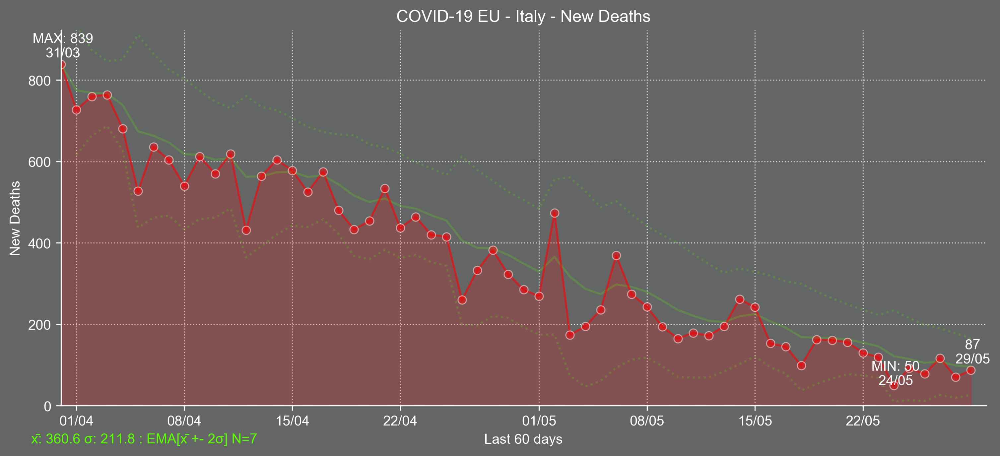

img\COVID-19 EU - Italy - New Deaths.png


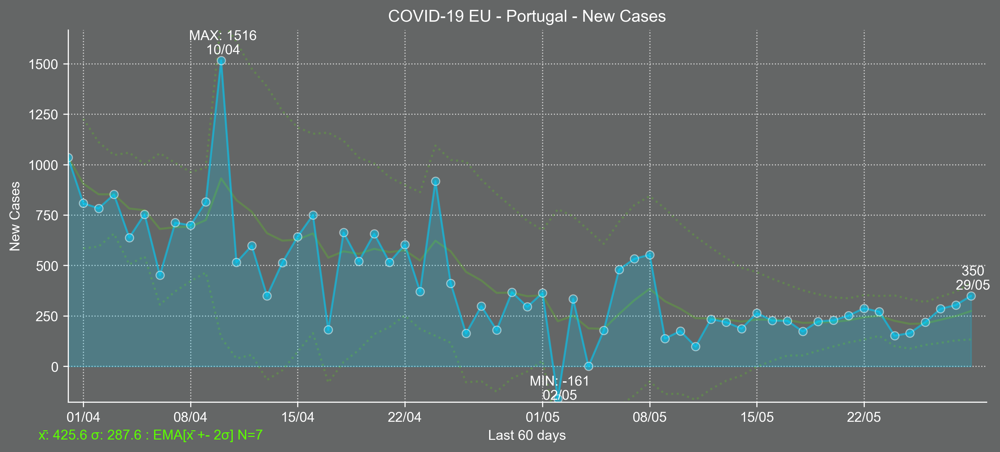

img\COVID-19 EU - Portugal - New Cases.png


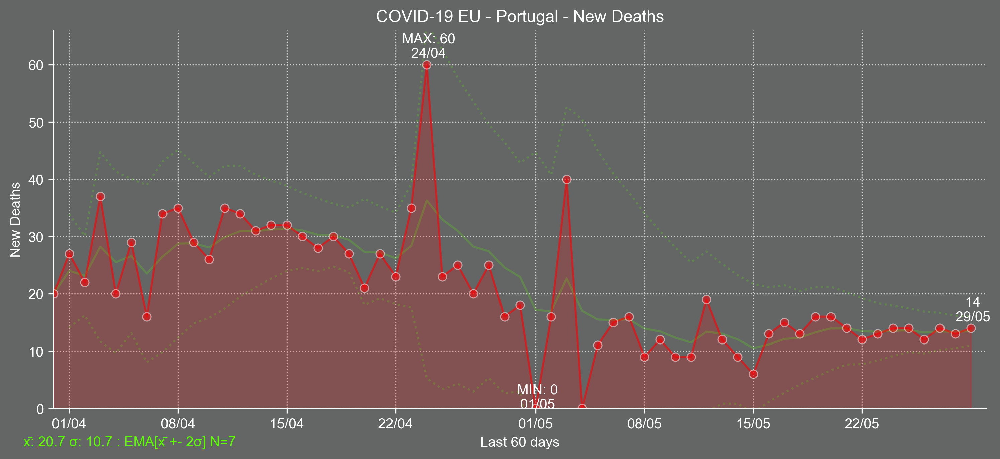

img\COVID-19 EU - Portugal - New Deaths.png


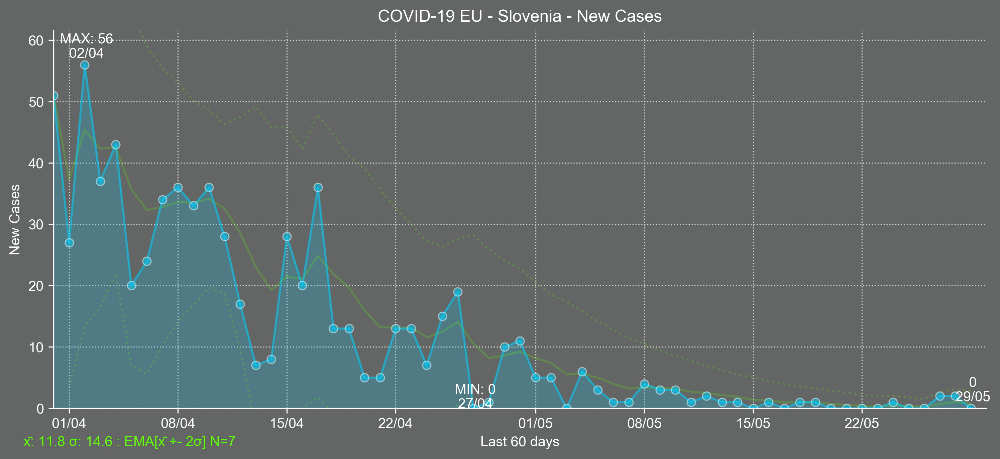

img\COVID-19 EU - Slovenia - New Cases.png


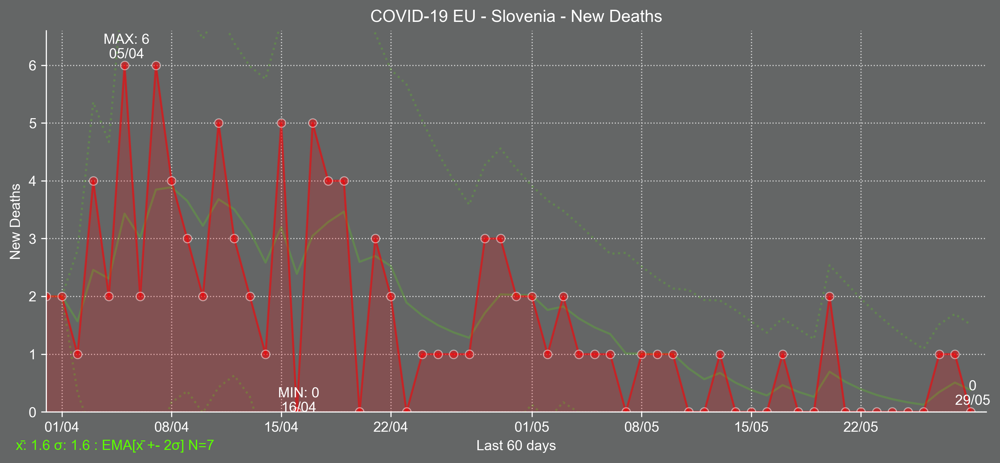

img\COVID-19 EU - Slovenia - New Deaths.png


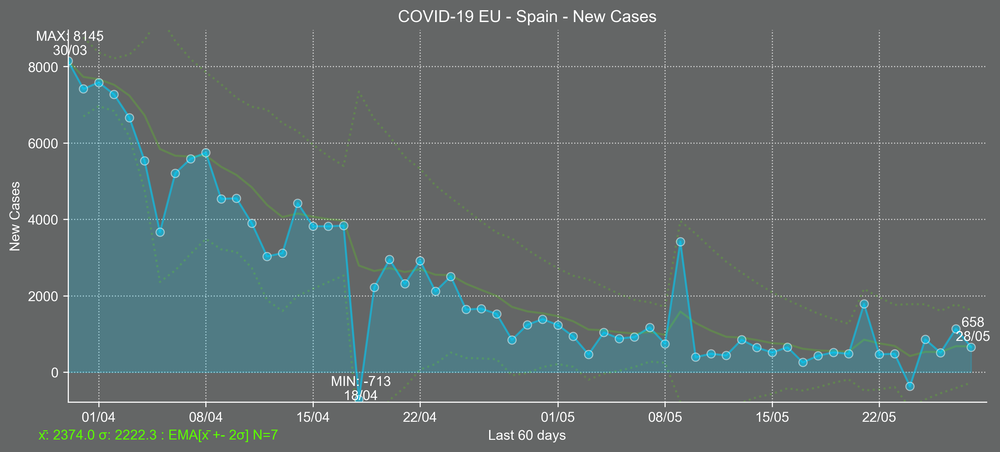

img\COVID-19 EU - Spain - New Cases.png


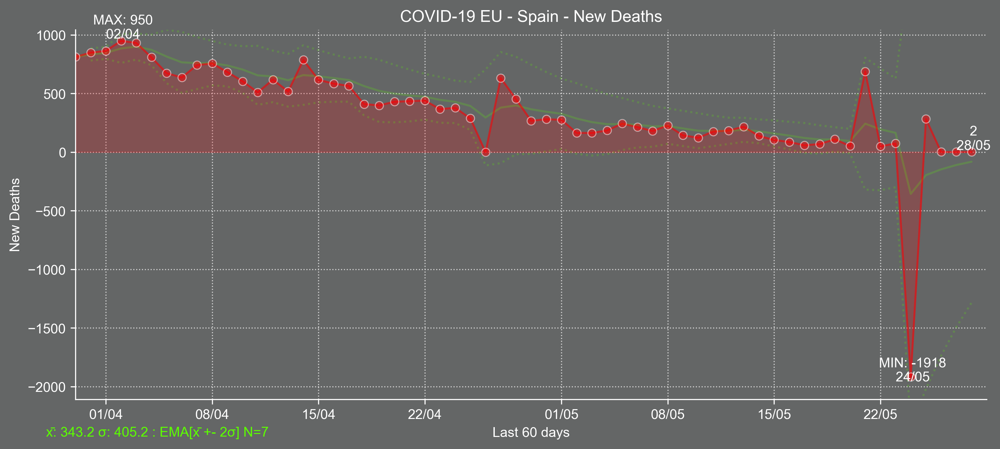

img\COVID-19 EU - Spain - New Deaths.png


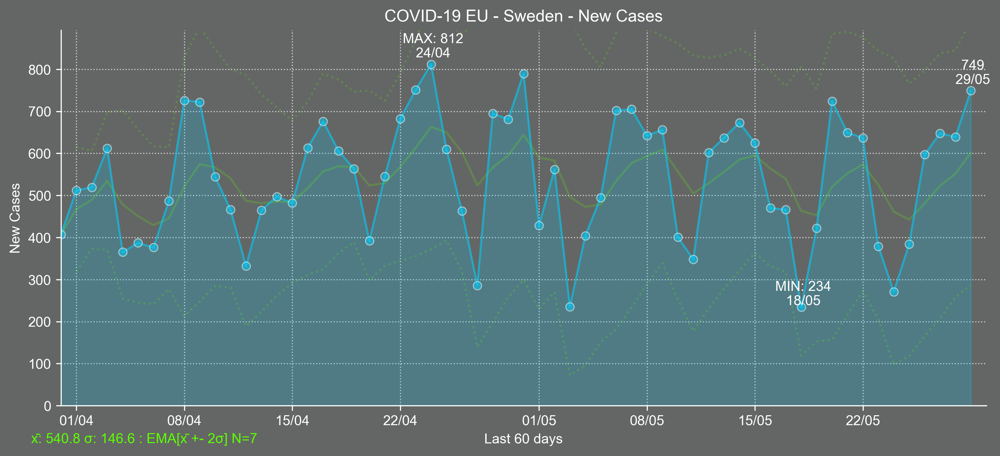

img\COVID-19 EU - Sweden - New Cases.png


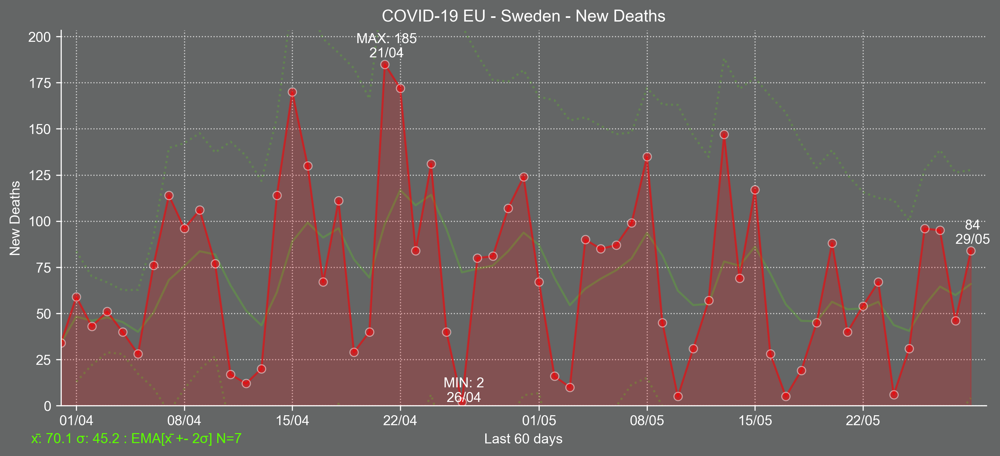

img\COVID-19 EU - Sweden - New Deaths.png


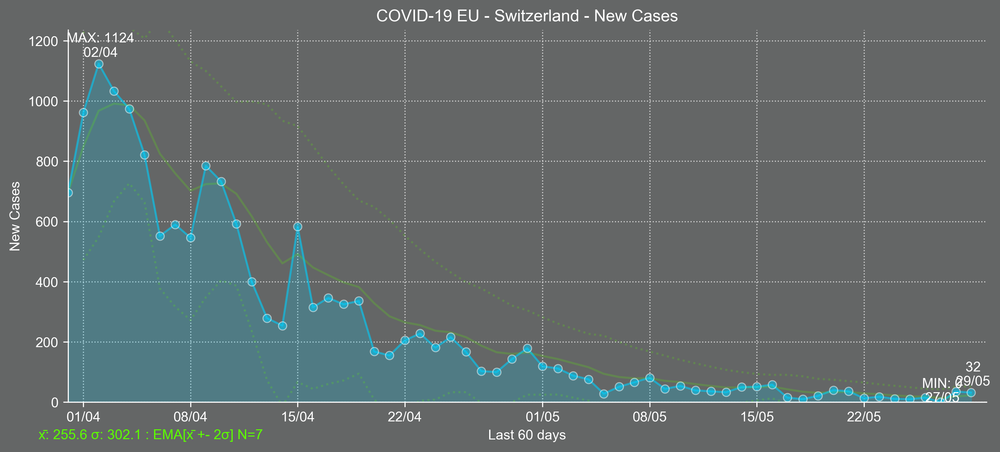

img\COVID-19 EU - Switzerland - New Cases.png


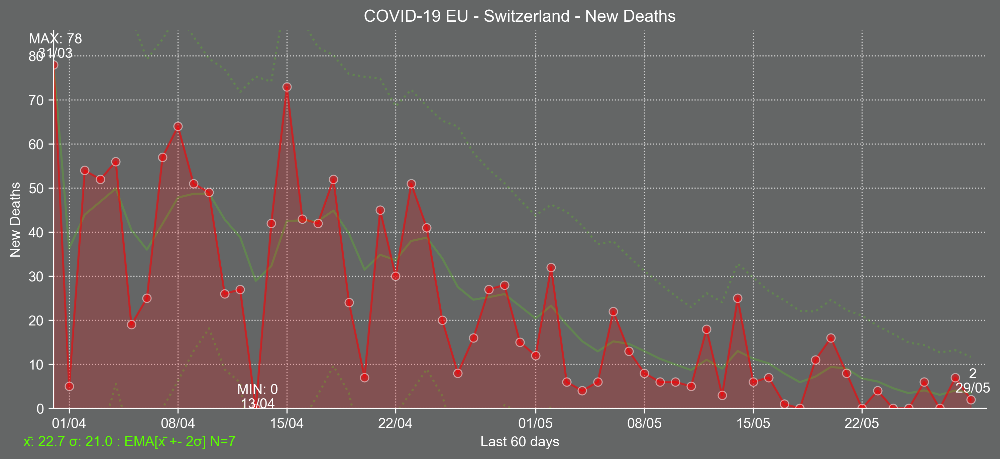

img\COVID-19 EU - Switzerland - New Deaths.png


In [12]:
# Show saved chart images with 300 dpi
import glob
from IPython.display import Image, display
for imageName in glob.glob('img/{}*.png'.format(s_title)): 
    display(Image(filename=imageName))
    print(imageName)

[]

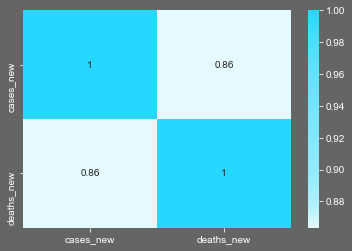

In [13]:
#Check correlation
from matplotlib.colors import LinearSegmentedColormap

boundaries = [0.0, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]  
hex_colors = sns.light_palette(d_confirmations['color'], n_colors=len(boundaries) * 2 + 2, as_cmap=False).as_hex()
hex_colors = [hex_colors[i] for i in range(0, len(hex_colors), 2)]
colors=list(zip(boundaries, hex_colors))
custom_color_map = LinearSegmentedColormap.from_list(
    name='custom_navy',
    colors=colors,
)


df_latest_corr = df_latest[[d_new_confirmations['key'],d_new_deaths['key']]].corr()
sns.heatmap(df_latest_corr,annot=True,cmap=custom_color_map)
plt.plot()

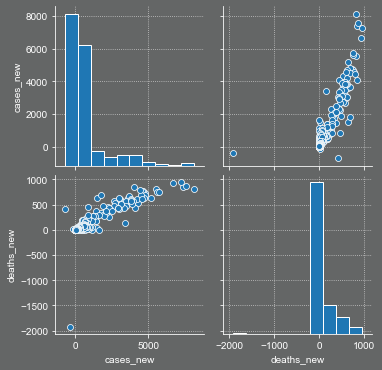

In [14]:
sns.pairplot(df_latest[[d_new_confirmations['key'],d_new_deaths['key']]])